# 📊 Segmentación con K‑Means

Este notebook ilustra paso a paso cómo aplicar **K‑Means** para descubrir segmentos significativos en los datos.

**Flujo de trabajo**  
1. Exploración y pre‑procesamiento  
2. Selección del número óptimo de clusters  
3. Entrenamiento del modelo  
4. Visualización e interpretación de resultados  

---


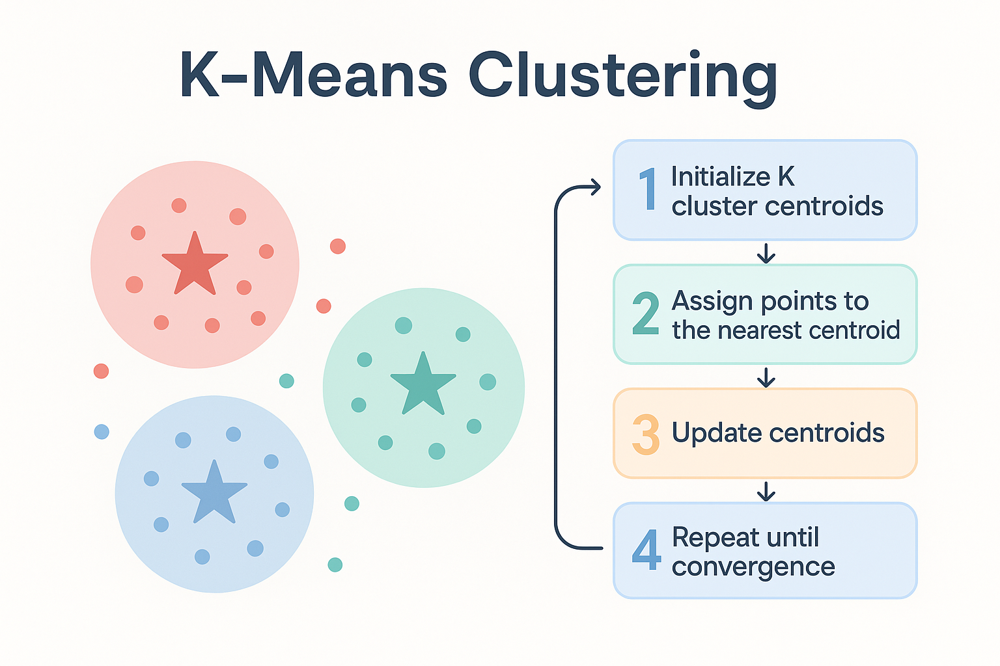

**K-means** es un algoritmo de aprendizaje no supervisado que agrupa datos numéricos en **K** conjuntos (clusters). Inicia seleccionando **K** centroides al azar y repite dos pasos:  
1. Asigna cada dato al centroide más cercano.  
2. Actualiza cada centroide calculando el promedio de los puntos que quedaron en su cluster.  

El ciclo continúa hasta que los centroides dejan de moverse, generando grupos de objetos similares de forma rápida y sencilla.


Una buena fuente de informacion :


1.   https://www.kaggle.com/code/prashant111/k-means-clustering-with-python
2.  https://www.kaggle.com/code/mesofianeyou/customer-segmentation-with-k-means

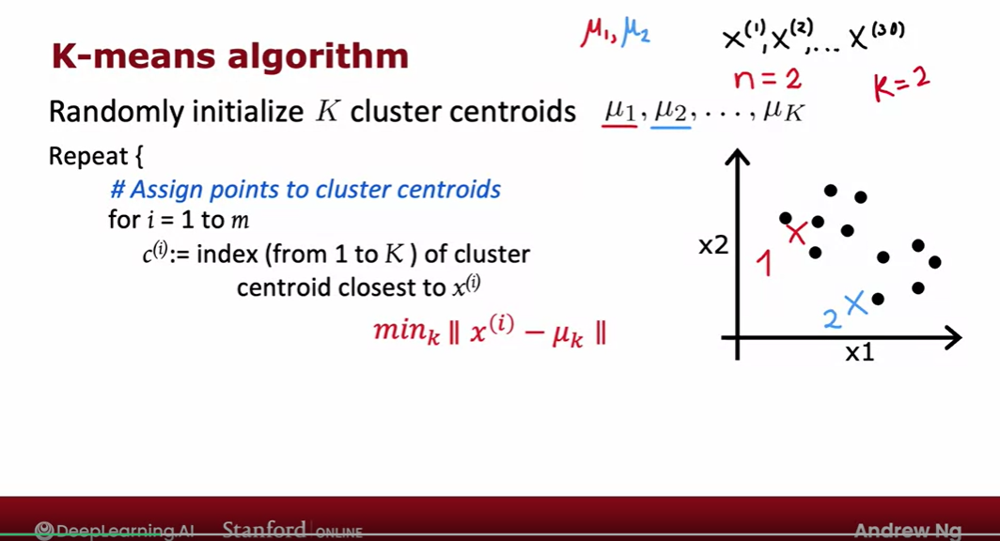

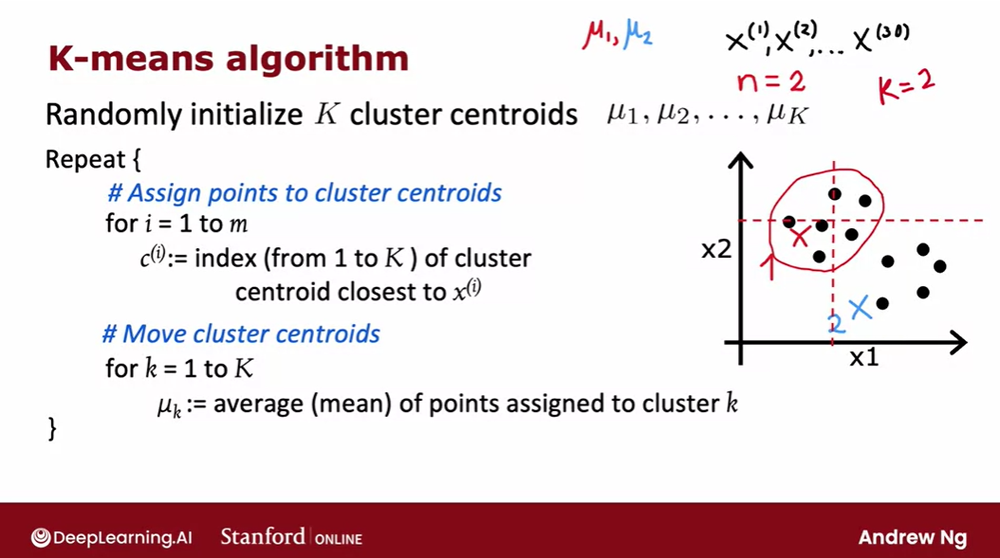

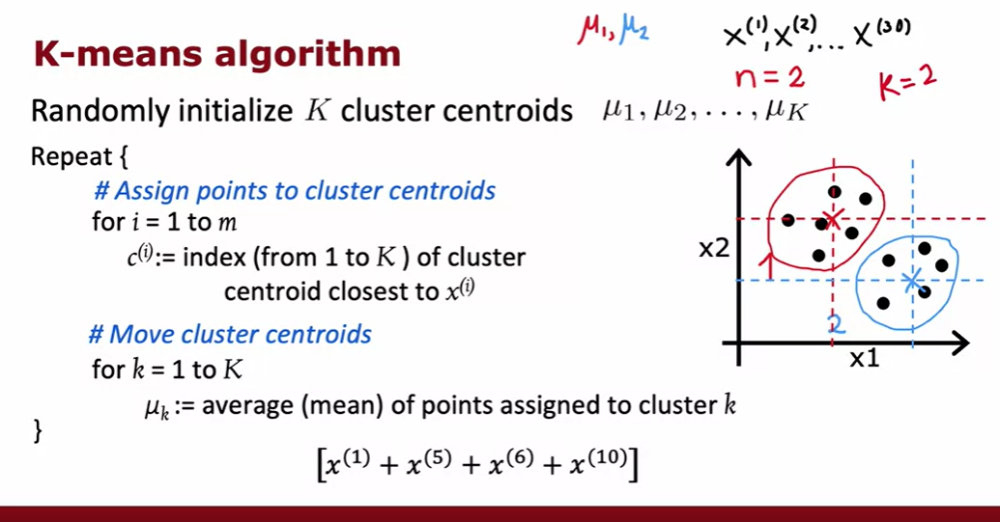

###FUNCION DE COSTO

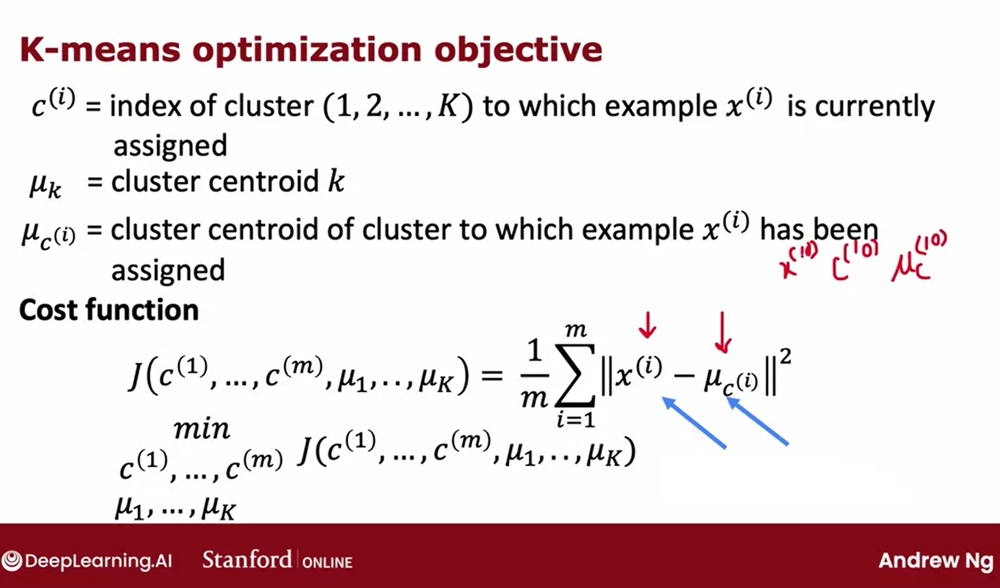

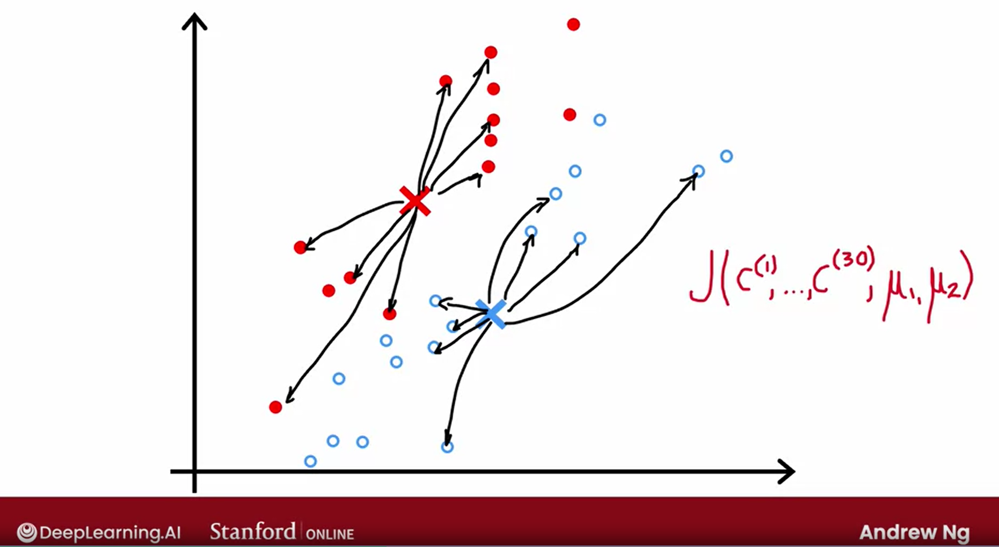

Piensa que cada punto "quiere estar lo más cerca posible" del centro de su grupo.
K-Means mueve los centros hasta lograr eso de la mejor forma global.

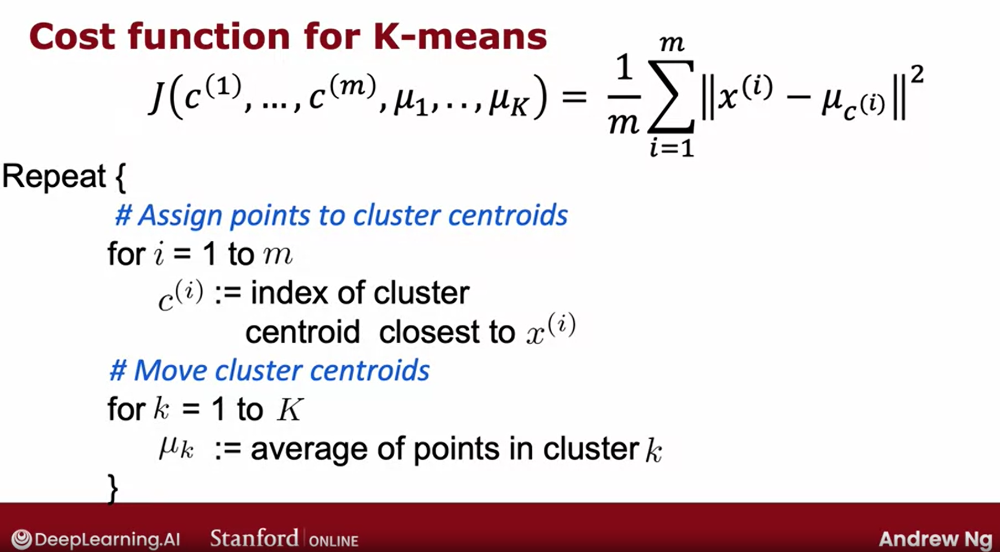

### 📐 ¿En qué consiste el método del codo (Elbow Method)?

El **método del codo** es una técnica gráfica utilizada para encontrar el número óptimo de clusters (**K**) al aplicar algoritmos como **K-Means**.

---

### 🧠 ¿Cómo funciona?

1. Se entrena el algoritmo K-Means con diferentes valores de \(K\) (por ejemplo, de 1 a 10).
2. Para cada \(K\), se calcula la **función de costo** (también llamada **inercia**), que representa la suma de las distancias cuadradas entre los puntos y sus centroides.
3. Se grafica la inercia vs. el número de clusters \(K\).

---

### 📉 ¿Qué se busca?

- A medida que \(K\) aumenta, la inercia disminuye (los puntos están más cerca de su centro).
- Pero después de cierto punto, la mejora se vuelve **marginal**.
- El **"codo"** de la gráfica es ese punto donde la disminución deja de ser significativa.
- Ese punto es considerado el **K óptimo**.

---

### 🖼️ Interpretación visual

La forma de la curva recuerda a un brazo doblado.  
El "codo" es donde se hace evidente que añadir más clusters no mejora mucho el agrupamiento.

---

### ✅ Ventajas

- Simple, visual y fácil de interpretar.
- Útil como primera estimación de \(K\).

---

### ⚠️ Limitaciones

- Puede no haber un "codo" claro en la gráfica.
- En casos más complejos, se recomienda complementarlo con el **índice de Silhouette** o métodos como la **Gap Statistic**.



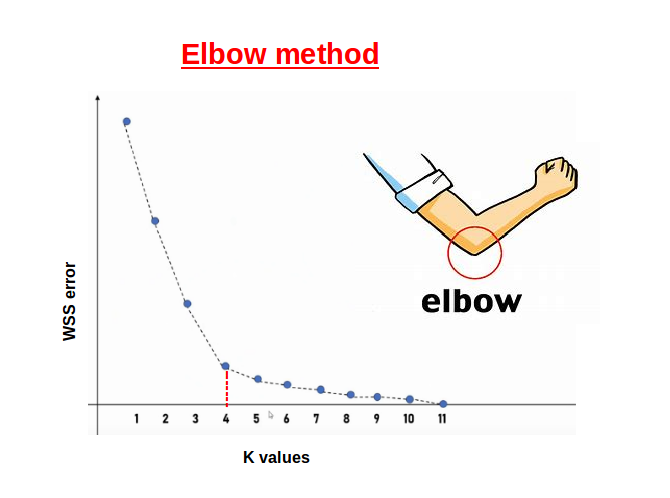

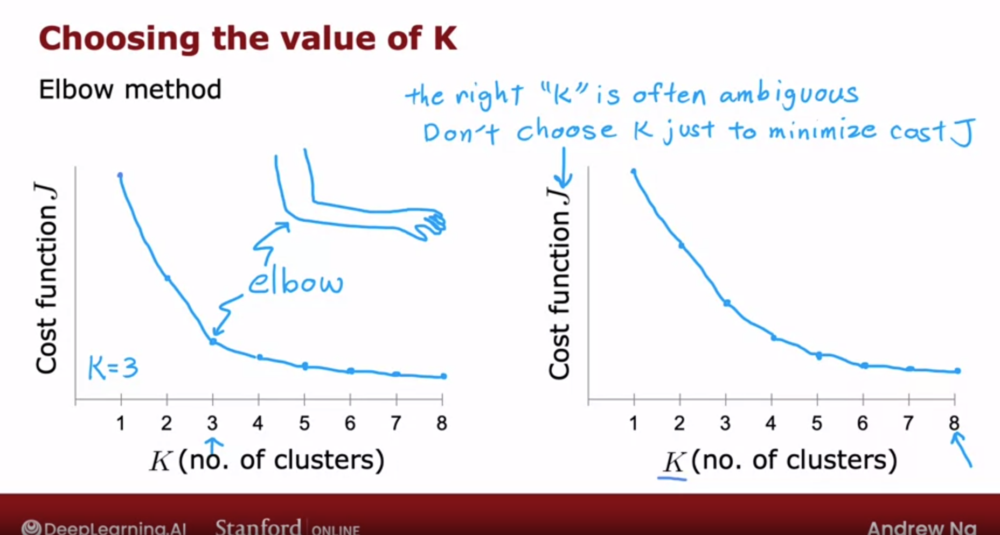

 ¿Qué enseña esta imagen?
No existe un único "valor correcto" de 𝐾


La elección de 𝐾 depende del uso que le daremos a los clusters (por ejemplo, marketing, clasificación médica, compresión de datos...).

Más clusters pueden dar más precisión, pero también pueden complicar la interpretación o no ser necesarios.

* comprimir imagenes por pixeles parecidos por agrupamiento

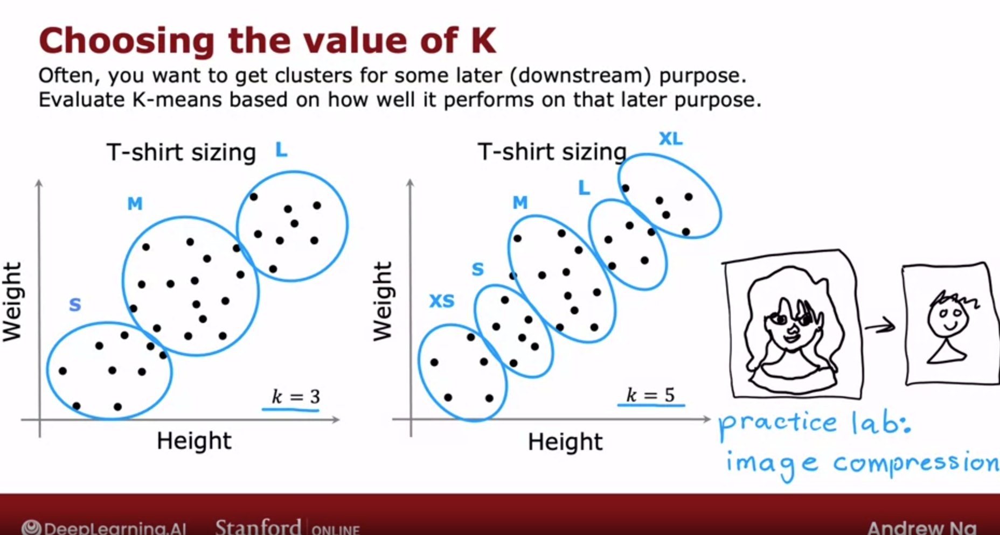

### Concepto Básico de K-means

K-means es un algoritmo de agrupamiento que particiona los datos en **K** clusters basándose en la distancia de cada punto de datos al centroide del cluster. El centroide de un cluster es el punto medio de todos los puntos de datos en ese cluster.

El algoritmo K-means funciona iterativamente para asignar cada punto de datos a uno de los K clusters en función de la distancia mínima al centroide. Los centroides de los clusters se actualizan en cada iteración hasta que la asignación de puntos de datos no cambie o hasta que se alcance un número máximo de iteraciones.

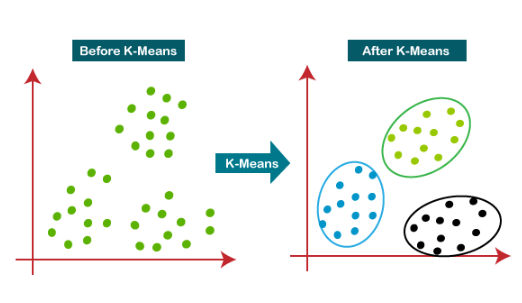

## 📦 Librerías y estilo

In [ ]:
from sklearn.datasets import load_iris
import pandas as pd

# Cargar el conjunto de datos Iris
data = load_iris()
X = data.data  # Características

# Crear un DataFrame para explorar los datos
df = pd.DataFrame(X, columns=data.feature_names)

# Mostrar las primeras filas del conjunto de datos
df.head()


,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,5.1,3.5,1.4,0.2
1,4.9,3.0,1.4,0.2
2,4.7,3.2,1.3,0.2
3,4.6,3.1,1.5,0.2
4,5.0,3.6,1.4,0.2


### 3. Escalado de Características

Como el algoritmo K-means es sensible a la escala de las características, es importante estandarizar los datos para que todas las características tengan la misma escala. Utilizaremos `StandardScaler` para escalar las características.

In [ ]:
from sklearn.preprocessing import StandardScaler

# Estandarizar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


### 4. Implementación del Algoritmo K-means

Implementemos el algoritmo K-means con un número inicial de clusters **K=3**, que es el número real de clases en el conjunto de datos. Luego, visualizaremos los clusters formados.

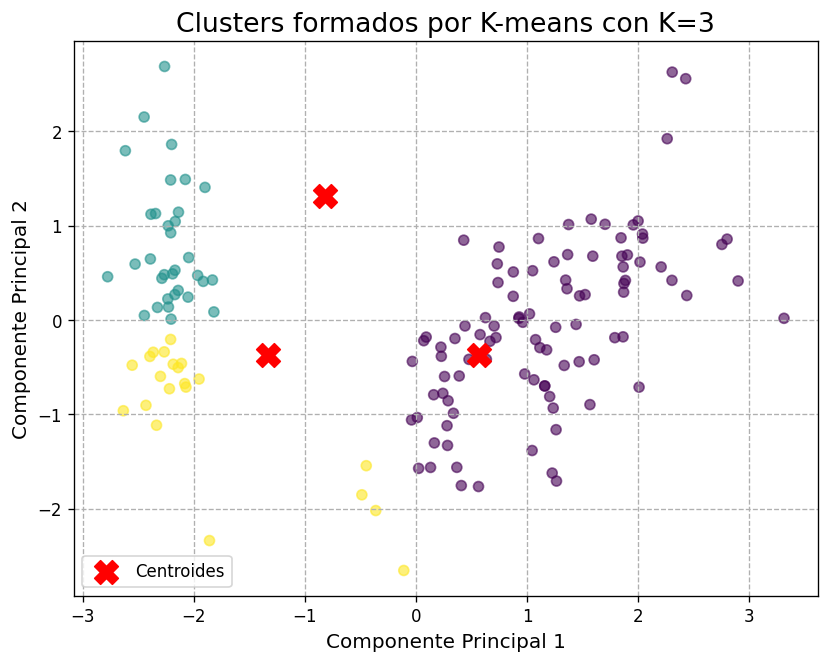

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Crear un modelo K-means con K=3
kmeans = KMeans(n_clusters=3, random_state=42) # azar queda fijado , sea reproducible

# Entrenar el modelo
kmeans.fit(X_scaled) # genera los cluster

# Predecir los clusters
y_kmeans = kmeans.predict(X_scaled)

# Visualización de los clusters en 2D utilizando PCA
from sklearn.decomposition import PCA

# Reducir a 2 componentes principales para visualización
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Graficar los clusters formados
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_kmeans, cmap='viridis', alpha=0.6)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=200, c='red', marker='X', label='Centroides')
plt.title("Clusters formados por K-means con K=3")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.legend()
plt.show()


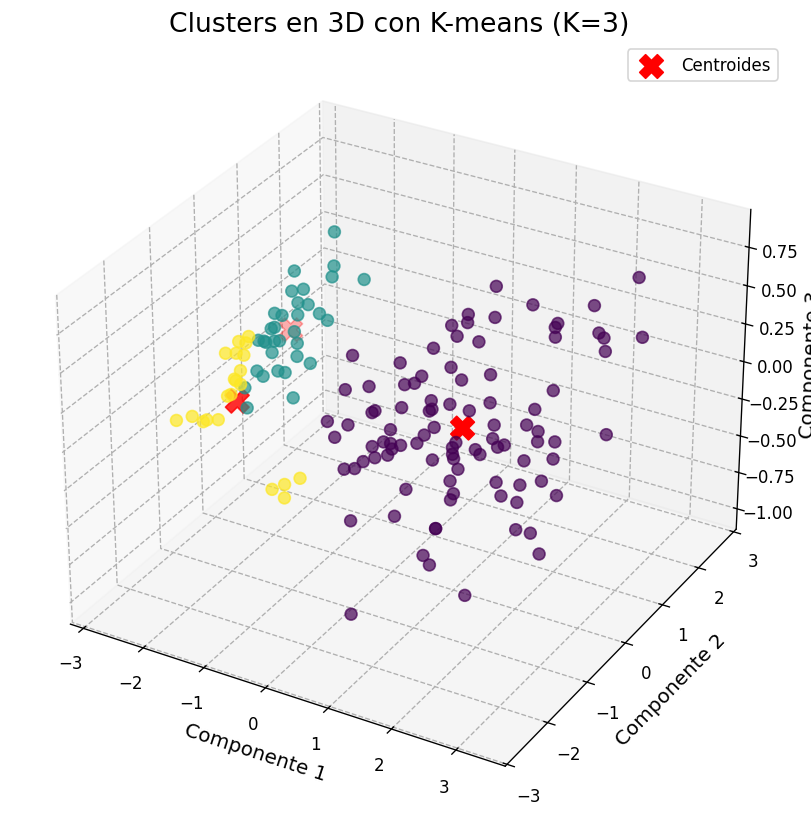

In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Necesario para proyecciones 3D

# Crear modelo K-means con K=3
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_scaled)

# Predecir los clusters
y_kmeans = kmeans.predict(X_scaled)

# PCA a 3 dimensiones para visualización 3D
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)

# Proyectar los centroides en el espacio PCA
centroids_pca = pca_3d.transform(kmeans.cluster_centers_)

# Visualización en 3D
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(
    X_pca_3d[:, 0], X_pca_3d[:, 1], X_pca_3d[:, 2],
    c=y_kmeans, cmap='viridis', s=50, alpha=0.7
)

# Dibujar centroides
ax.scatter(
    centroids_pca[:, 0], centroids_pca[:, 1], centroids_pca[:, 2],
    s=200, c='red', marker='X', label='Centroides'
)

ax.set_title("Clusters en 3D con K-means (K=3)")
ax.set_xlabel("Componente 1")
ax.set_ylabel("Componente 2")
ax.set_zlabel("Componente 3")
ax.legend()
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import plotly.graph_objects as go
import pandas as pd

# Entrenar K-Means
kmeans = KMeans(n_clusters=3, random_state=42)
y_kmeans = kmeans.fit_predict(X_scaled)

# PCA para reducir a 3D
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)

# Proyectar los centroides en el espacio PCA
centroids_pca = pca_3d.transform(kmeans.cluster_centers_)

# Crear DataFrame para los puntos
df_plot = pd.DataFrame(X_pca_3d, columns=["PC1", "PC2", "PC3"])
df_plot["Cluster"] = y_kmeans.astype(str)

# Crear figura
fig = go.Figure()

# Agregar los puntos de cada cluster
for cluster_label in df_plot["Cluster"].unique():
    cluster_data = df_plot[df_plot["Cluster"] == cluster_label]
    fig.add_trace(go.Scatter3d(
        x=cluster_data["PC1"],
        y=cluster_data["PC2"],
        z=cluster_data["PC3"],
        mode='markers',
        marker=dict(size=5),
        name=f"Cluster {cluster_label}"
    ))

# Agregar los centroides
fig.add_trace(go.Scatter3d(
    x=centroids_pca[:, 0],
    y=centroids_pca[:, 1],
    z=centroids_pca[:, 2],
    mode='markers',
    marker=dict(
        size=10,
        color='red',
        symbol='x',
        line=dict(width=2)
    ),
    name='Centroides'
))

# Configurar layout bonito
fig.update_layout(
    title="Clusters 3D con K-Means y Centroides",
    scene=dict(
        xaxis_title='Componente 1',
        yaxis_title='Componente 2',
        zaxis_title='Componente 3'
    ),
    height=700,
    showlegend=True
)

fig.show()


### 5. Selección del Número Óptimo de Clusters

El método del codo es una técnica popular para encontrar el número óptimo de clusters **K**. Calcula la suma de los errores cuadrados dentro de cada cluster (inercia) para diferentes valores de **K** y elige el valor donde la disminución de la inercia se desacelera significativamente.

## 🔍 Análisis exploratorio (EDA)

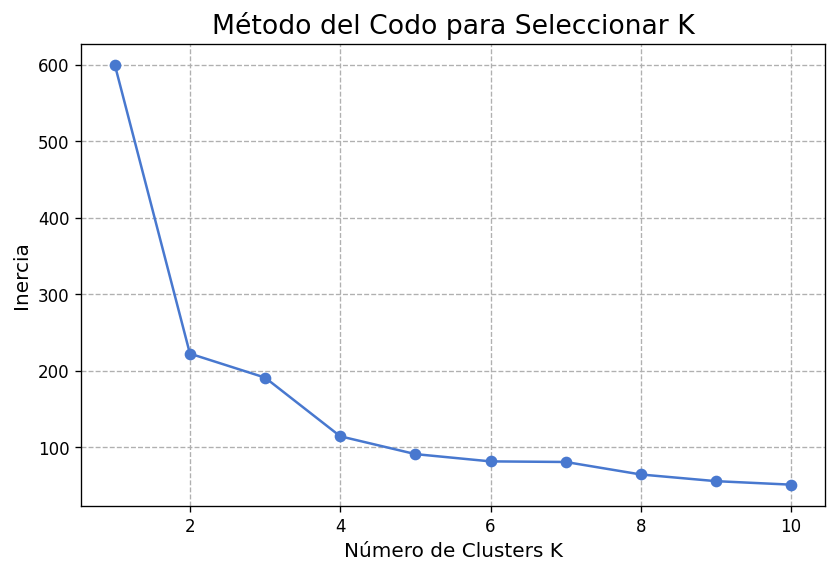

In [ ]:
inertias = []
K_range = range(1, 11)

# Calcular inercia para diferentes valores de K
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)

# Graficar el método del codo
plt.figure(figsize=(8, 5))
plt.plot(K_range, inertias, marker='o')
plt.title("Método del Codo para Seleccionar K")
plt.xlabel("Número de Clusters K")
plt.ylabel("Inercia")
plt.grid(True)
plt.show()


✨ Una frase corta para recordar:
"En K-Means, la inercia mide cuánto les cuesta a los puntos 'quedarse' cerca de su centroide.

### 6. Visualización de las Fronteras de Decisión para Diferentes Valores de K

Podemos visualizar cómo cambian las fronteras de decisión de los clusters al cambiar el número de clusters **K**. Utilizaremos la función `plot_decision_regions()` de la biblioteca **mlxtend** para simplificar la visualización.

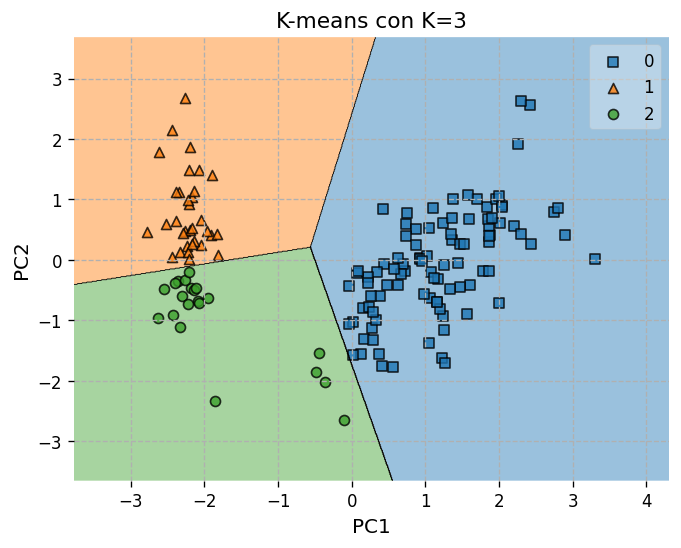

In [ ]:
from mlxtend.plotting import plot_decision_regions

def kmeans_decision_boundaries(data, k):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(data)

    plot_decision_regions(data, kmeans.labels_, clf=kmeans)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title(f"K-means con K={k}", fontsize=13)
    plt.show()

# Visualización para K=3
kmeans_decision_boundaries(X_pca, 3)


### **Clustering con K-Means**

### **¿Qué es el Clustering?**

Clustering es una técnica utilizada en aprendizaje no supervisado para agrupar puntos de datos similares en función de sus características intrínsecas o similitudes. Su objetivo es identificar patrones o estructuras en los datos sin conocimiento previo de los grupos o etiquetas.

En clustering, los puntos de datos se agrupan en clusters en función de su proximidad en el espacio de características.

**El objetivo es maximizar la similitud dentro de los clusters (entre puntos parecidos) y minimizar la similitud entre diferentes clusters (distintos).**

Los algoritmos de clustering asignan puntos de datos a clusters considerando la similitud o disimilitud entre los atributos de los puntos de datos o las distancias entre ellos.

El clustering se utiliza ampliamente en diversos campos, como minería de datos, reconocimiento de patrones, análisis de imágenes, segmentación de clientes, investigación de mercado y detección de anomalías. Ayuda a descubrir patrones ocultos, entender distribuciones de datos y organizar grandes conjuntos de datos en grupos significativos para un análisis o toma de decisiones posterior.

### **Problema de Negocio**

*Has sido asignado como analista de redes sociales responsable de gestionar las cuentas de redes sociales de una empresa. La empresa tiene como objetivo analizar el rendimiento de sus publicaciones en redes sociales y obtener los mejores resultados. Por lo tanto, tú y tu equipo comenzarán a examinar un conjunto de datos que contiene información sobre publicaciones en redes sociales.

Utilizarás el conjunto de datos para analizar el rendimiento de las publicaciones de la empresa. Tu objetivo es comparar las tasas de interacción y compartición de diferentes tipos de publicaciones. De esta manera, pretendes descubrir qué tipos de publicaciones pueden generar más participación y comparticiones para la empresa.*

### **Historia de los Datos**

El conjunto de datos contiene características de publicaciones en redes sociales. A continuación se presentan las explicaciones de las variables en el conjunto de datos:

- num_reactions: Número total de reacciones recibidas por la publicación.
  
- num_comments: Número total de comentarios recibidos por la publicación.
  
- num_shares: Número de veces que se ha compartido la publicación.
  
- num_likes: Número de "me gusta" recibidos por la publicación.
  
- num_loves: Número de reacciones "me encanta" recibidas por la publicación.
  
- num_wows: Número de reacciones "me asombra" recibidas por la publicación.
  
- num_hahas: Número de reacciones "me divierte" recibidas por la publicación.
  
- num_sads: Número de reacciones "me entristece" recibidas por la publicación.
  
- num_angrys: Número de reacciones "me enfada" recibidas por la publicación.
  
- status_type_link: 1 si la publicación contiene un enlace, 0 en caso contrario.
  
- status_type_photo: 1 si la publicación contiene una foto, 0 en caso contrario.
  
- status_type_status: 1 si la publicación contiene texto, 0 en caso contrario.
  
- status_type_video: 1 si la publicación contiene un video, 0 en caso contrario.


### **Hoja de Ruta**

1) Importar las Librerías Necesarias.

2) Cargar el Conjunto de Datos.

3) Verificar las Columnas del Conjunto de Datos.

4) Crear un Objeto de Modelo.

5) Entrenamiento del Modelo.

6) Predicciones del Modelo.

7) Etiquetas Únicas y sus Contajes.

8) Análisis de Silueta para Diferentes Números de Clusters: Agrupamiento con KMeans.

18) Tipo de Estado Más Frecuente.

19) Conjunto de Datos Combinado con Etiquetas y Tipo de Estado.

20) Contar los Tipos de Estado para Cada Etiqueta.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

warnings.simplefilter(action="ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

path = '/content/drive/MyDrive/Colab Notebooks/notebooks ML1/DATA/'

filename = 'Live.csv'

Mounted at /content/drive


## 📂 Carga de datos

In [ ]:
df = pd.read_csv(f"{path}{filename}")

In [ ]:
df.info() #Estructura del dataset, este comando dice tipos de columnas, nombres de columnas, ctamaño del  dataset en memoria y número de entradas o filas (7049)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7050 entries, 0 to 7049
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   status_id         7050 non-null   object 
 1   status_type       7050 non-null   object 
 2   status_published  7050 non-null   object 
 3   num_reactions     7050 non-null   int64  
 4   num_comments      7050 non-null   int64  
 5   num_shares        7050 non-null   int64  
 6   num_likes         7050 non-null   int64  
 7   num_loves         7050 non-null   int64  
 8   num_wows          7050 non-null   int64  
 9   num_hahas         7050 non-null   int64  
 10  num_sads          7050 non-null   int64  
 11  num_angrys        7050 non-null   int64  
 12  Column1           0 non-null      float64
 13  Column2           0 non-null      float64
 14  Column3           0 non-null      float64
 15  Column4           0 non-null      float64
dtypes: float64(4), int64(9), object(3)
memory 

In [ ]:
df.head() #cheqeuamos la estructura del dataset

,status_id,status_type,status_published,num_reactions,num_comments,num_shares,num_likes,num_loves,num_wows,num_hahas,num_sads,num_angrys,Column1,Column2,Column3,Column4
0,246675545449582_1649696485147474,video,4/22/2018 6:00,529,512,262,432,92,3,1,1,0,NaN,NaN,NaN,NaN
1,246675545449582_1649426988507757,photo,4/21/2018 22:45,150,0,0,150,0,0,0,0,0,NaN,NaN,NaN,NaN
2,246675545449582_1648730588577397,video,4/21/2018 6:17,227,236,57,204,21,1,1,0,0,NaN,NaN,NaN,NaN
3,246675545449582_1648576705259452,photo,4/21/2018 2:29,111,0,0,111,0,0,0,0,0,NaN,NaN,NaN,NaN
4,246675545449582_1645700502213739,photo,4/18/2018 3:22,213,0,0,204,9,0,0,0,0,NaN,NaN,NaN,NaN


In [ ]:
df.describe() #Reporte estadístico de las variables numéricas

,num_reactions,num_comments,num_shares,num_likes,num_loves,num_wows,num_hahas,num_sads,num_angrys,Column1,Column2,Column3,Column4
count,7050.000000,7050.000000,7050.000000,7050.000000,7050.000000,7050.000000,7050.000000,7050.000000,7050.000000,0.0,0.0,0.0,0.0
mean,230.117163,224.356028,40.022553,215.043121,12.728652,1.289362,0.696454,0.243688,0.113191,NaN,NaN,NaN,NaN
std,462.625309,889.636820,131.599965,449.472357,39.972930,8.719650,3.957183,1.597156,0.726812,NaN,NaN,NaN,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
25%,17.000000,0.000000,0.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
50%,59.500000,4.000000,0.000000,58.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
75%,219.000000,23.000000,4.000000,184.750000,3.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN
max,4710.000000,20990.000000,3424.000000,4710.000000,657.000000,278.000000,157.000000,51.000000,31.000000,NaN,NaN,NaN,NaN


In [ ]:
df.status_type.value_counts() #Categorías de la variable categórica status_type: Que habla del tipo de publiación...la mayoría de publicaciones en el dataset son Fotos.

,count
status_type,
photo,4288
video,2334
status,365
link,63


### ATENCIÓN a estos recuentos de tipos de publicacones en redes sociales. El clustering más adelante las retoma de manera automática o NO SUPERVISADA

In [ ]:
# Cargamos una versión procesada del dataset dónde ya se hizo escalada, eliminación de variables no numéricas y otros cambios, También se hizo ONE HOT enconding a la variable de status type

path = '/content/drive/MyDrive/Colab Notebooks/notebooks ML1/DATA/'

filename = 'Live_processed.csv'

In [ ]:
df = pd.read_csv(f"{path}{filename}")

In [ ]:
df.head()

,num_reactions,num_comments,num_shares,num_likes,num_loves,num_wows,num_hahas,num_sads,num_angrys,status_type_link,status_type_photo,status_type_status,status_type_video
0,0.112314,0.024393,0.076519,0.091720,0.140030,0.010791,0.006369,0.019608,0.0,0.0,0.0,0.0,1.0
1,0.031847,0.000000,0.000000,0.031847,0.000000,0.000000,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0
2,0.048195,0.011243,0.016647,0.043312,0.031963,0.003597,0.006369,0.000000,0.0,0.0,0.0,0.0,1.0
3,0.023567,0.000000,0.000000,0.023567,0.000000,0.000000,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0
4,0.045223,0.000000,0.000000,0.043312,0.013699,0.000000,0.000000,0.000000,0.0,0.0,1.0,0.0,0.0


### Instanciamos un modelo de KMeans  (Previamente importado desde Scikit learn cluster)

## 🤖 Entrenamiento de K‑Means

In [ ]:
model = KMeans(n_clusters=4)

### Entrenamos el modelo con la data de entrenamiento

In [ ]:
model.fit(df)

KMeans(n_clusters=4)

### **Generamos los labels o etiquetas al predecir con el mismo dataset que entrenamos nuestro modelo de K-Means.  Labels sería equivalente a decir los grupos o clusters de datos que el algoritmo ha encontrado de manera NO supervisada, es decir, yo no le dije al algoritmo a que grupo pertenecian los datos!!**

In [ ]:
labels = model.predict(df)

In [ ]:
np.unique(labels, return_counts=True) #ESTE es un value_counts() hecho a un numpy array , value en para pandas

(array([0, 1, 2, 3], dtype=int32), array([4288, 2334,  365,   63]))

### 🪞 ¿Qué es el Score de Silueta?

El **score de silueta** mide qué tan bien se agrupa cada punto en su propio cluster en comparación con los clusters vecinos.  

- Toma valores entre **-1** y **1**:
  - Un valor cercano a **1** indica que el punto está **bien agrupado**.
  - Un valor cercano a **0** sugiere que el punto está **en el borde** entre dos clusters.
  - Un valor cercano a **-1** indica que el punto **podría estar mal asignado**.

El promedio de todos los scores de silueta da una idea general de la **calidad del agrupamiento**.  
Un score promedio más alto indica clusters más compactos y separados.

---


In [ ]:
# 1. Importar librerías necesarias
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples

# 2. Entrenar modelo K-Means (ajustable el número de clusters)
kmeans = KMeans(n_clusters=3, random_state=42)
y_kmeans = kmeans.fit_predict(X_scaled)  # etiquetas predichas

# 3. Calcular valores de silueta por muestra
sil_vals = silhouette_samples(X_scaled, y_kmeans)

# 4. Preparar la figura
fig, ax = plt.subplots(figsize=(8, 6))

# 5. Definir variables auxiliares
n_clusters = kmeans.n_clusters
y_lower = 10  # espacio inicial en Y

# Paleta de colores (una para cada cluster)
cmap = cm.get_cmap("tab10")
colors = cmap(np.linspace(0, 1, n_clusters))

# 6. Graficar cada cluster
for i in range(n_clusters):
    # Valores de silueta del cluster i
    ith_cluster_silhouette = sil_vals[y_kmeans == i]
    ith_cluster_silhouette.sort()

    size_cluster = ith_cluster_silhouette.shape[0]
    y_upper = y_lower + size_cluster

    ax.fill_betweenx(
        np.arange(y_lower, y_upper),
        0,
        ith_cluster_silhouette,
        facecolor=colors[i],
        edgecolor=colors[i],
        alpha=0.7
    )

    # Etiqueta del cluster en la mitad del área
    ax.text(-0.05, y_lower + 0.5 * size_cluster, f'Cluster {i+1}')

    y_lower = y_upper + 10  # espacio entre clusters

# 7. Agregar detalles finales
mean_silhouette = np.mean(sil_vals)

ax.set_title(f"Silhouette Plot para K-Means (K={n_clusters}) - Media={mean_silhouette:.2f}")
ax.set_xlabel("Coeficiente de silueta")
ax.set_ylabel("Índice de muestra (ordenado por cluster)")
ax.axvline(x=mean_silhouette, color="red", linestyle="--", label=f"Media Silueta ({mean_silhouette:.2f})")
ax.legend()
plt.show()


NameError: name 'X_scaled' is not defined

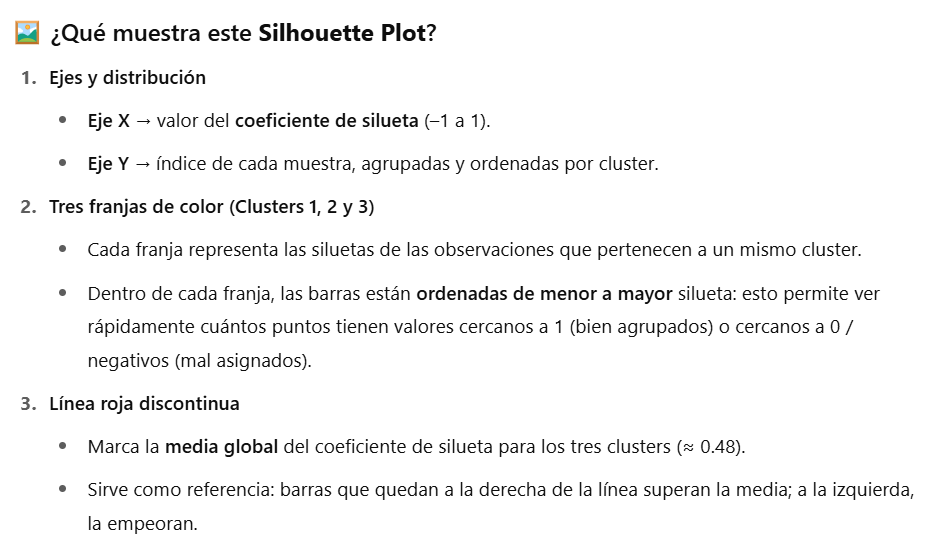

For n_clusters=2, The Silhouette Coefficient is 0.8188237721696822
For n_clusters=3, The Silhouette Coefficient is 0.8972493682244883
For n_clusters=4, The Silhouette Coefficient is 0.8731037704207545
For n_clusters=5, The Silhouette Coefficient is 0.8866768371183754
For n_clusters=6, The Silhouette Coefficient is 0.8432302011675074
For n_clusters=7, The Silhouette Coefficient is 0.8001973440338584
For n_clusters=8, The Silhouette Coefficient is 0.765958443745436
For n_clusters=9, The Silhouette Coefficient is 0.759842970011297
For n_clusters=10, The Silhouette Coefficient is 0.7270880202211282
For n_clusters=11, The Silhouette Coefficient is 0.6547916296479471


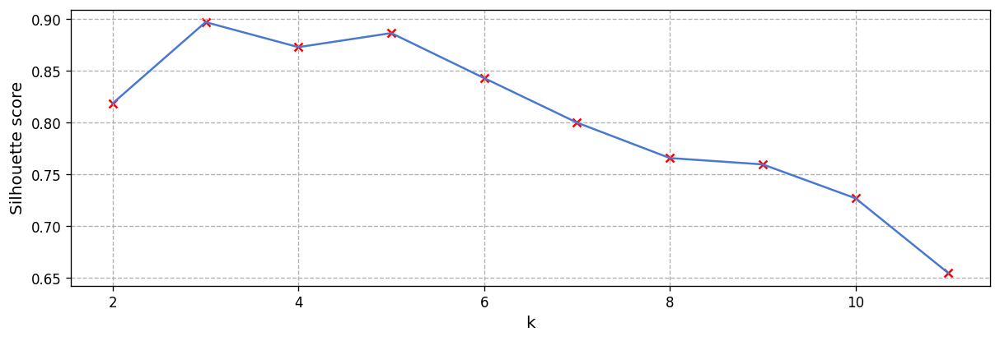

In [ ]:
silhouettes = []
ks = list(range(2, 12))
for n_cluster in ks:
    kmeans = KMeans(n_clusters=n_cluster).fit(df)
    label = kmeans.labels_
    sil_coeff = silhouette_score(df, label, metric='euclidean') #Después de la inercia lo más utilizado es el score de Silueta.
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))
    silhouettes.append(sil_coeff)

plt.figure(figsize=(12, 8))
plt.subplot(211)
plt.scatter(ks, silhouettes, marker='x', c='r')
plt.plot(ks, silhouettes)
plt.xlabel('k')
plt.ylabel('Silhouette score');

#Homogeneidad del CLUSTER

In [ ]:
# Step 4: (Optional) Convert the scaled array back to a DataFrame for easier analysis
df = pd.DataFrame(df, columns=df.columns)
df['labels'] = labels  # Add the cluster labels for analysis

In [ ]:
status_type = df[["status_type_photo", "status_type_video", "status_type_status"]].idxmax(axis=1)  # les pongo un nombre

In [ ]:
df = pd.concat([df["labels"],status_type.rename("status_type")], axis=1)

## 🗂️ Perfilado e interpretación

In [ ]:
df.groupby(["labels","status_type"])["status_type"].count()

,,status_type
labels,status_type,
0,status_type_photo,4288
1,status_type_video,2334
2,status_type_status,365
3,status_type_photo,63


### Segmentacion de Clientes

In [ ]:
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

path = '/content/drive/MyDrive/Colab Notebooks/notebooks ML1/DATA/'

filename = 'Customer_Data.csv'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv(f"{path}{filename}")

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.offline as offline
offline.init_notebook_mode()

import warnings
warnings.filterwarnings ("ignore")

In [ ]:
print ("Shape of data: {}" . format (df.shape))
print ("Number of rows: {}" . format (df.shape [0]))
print ("Number of columns: {}" . format (df.shape [1]))

Shape of data: (8950, 18)
Number of rows: 8950
Number of columns: 18


In [ ]:
df.describe (include = "all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CUST_ID,8950,8950,C10001,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BALANCE,8950.0,NaN,NaN,NaN,1564.474828,2081.531879,0.0,128.281915,873.385231,2054.140036,19043.13856
BALANCE_FREQUENCY,8950.0,NaN,NaN,NaN,0.877271,0.236904,0.0,0.888889,1.0,1.0,1.0
PURCHASES,8950.0,NaN,NaN,NaN,1003.204834,2136.634782,0.0,39.635,361.28,1110.13,49039.57
ONE_OFF_PURCHASES,8950.0,NaN,NaN,NaN,592.437371,1659.887917,0.0,0.0,38.0,577.405,40761.25
INSTALLMENTS_PURCHASES,8950.0,NaN,NaN,NaN,411.067645,904.338115,0.0,0.0,89.0,468.6375,22500.0
CASH_ADVANCE,8950.0,NaN,NaN,NaN,978.871112,2097.163877,0.0,0.0,0.0,1113.821139,47137.21176
PURCHASES_FREQUENCY,8950.0,NaN,NaN,NaN,0.490351,0.401371,0.0,0.083333,0.5,0.916667,1.0
ONE_OFF_PURCHASES_FREQUENCY,8950.0,NaN,NaN,NaN,0.202458,0.298336,0.0,0.0,0.083333,0.3,1.0
PURCHASES_INSTALLMENTS_FREQUENCY,8950.0,NaN,NaN,NaN,0.364437,0.397448,0.0,0.0,0.166667,0.75,1.0


In [ ]:
print ("Duplicate values in df are:" , df.duplicated ().sum ())

Duplicate values in df are: 0


In [ ]:
df1 = df.copy ()

In [ ]:
df2 = df.copy()

In [ ]:
# Function to capitalize column names
df1.columns = [col.title() for col in df1.columns]

In [ ]:
Minimum_Payments = df1 ["Minimum_Payments"]
i = 0
for payments, minimum_payments in zip (df1 ["Payments"] , df1 ["Minimum_Payments"].isna()):
    if (payments == 0) and (minimum_payments == True):
        Minimum_Payments [i] = 0
    elif (payments > 0) and (minimum_payments == True):
        Minimum_Payments [i] = Minimum_Payments [i]
    i += 1

df1 ["Minimum_Payments"] = Minimum_Payments

In [ ]:
df_2 = (df1 [df1 ["Minimum_Payments"].isna() == True])
df_3 = (df_2 [df_2 ["Payments"] == 0])
df_3

,Cust_Id,Balance,Balance_Frequency,Purchases,One_Off_Purchases,Installments_Purchases,Cash_Advance,Purchases_Frequency,One_Off_Purchases_Frequency,Purchases_Installments_Frequency,Cash_Advance_Frequency,Cash_Advance_Trx,Purchases_Trx,Credit_Limit,Payments,Minimum_Payments,Prc_Full_Payment,Tenure


In [ ]:
df.columns = [i.title() for i in df2.columns]
df.columns

Index(['Cust_Id', 'Balance', 'Balance_Frequency', 'Purchases',
       'One_Off_Purchases', 'Installments_Purchases', 'Cash_Advance',
       'Purchases_Frequency', 'One_Off_Purchases_Frequency',
       'Purchases_Installments_Frequency', 'Cash_Advance_Frequency',
       'Cash_Advance_Trx', 'Purchases_Trx', 'Credit_Limit', 'Payments',
       'Minimum_Payments', 'Prc_Full_Payment', 'Tenure'],
      dtype='object')

In [ ]:
Missing_values_percentange = 100 * df1["Credit_Limit"].isnull().sum()/len(df1)
print ("Missing values percentange for 'Credit_Limit' is:" , Missing_values_percentange)
Missing_values_percentange = 100 * df1["Minimum_Payments"].isnull().sum()/len(df1)
print ("Missing values percentange for 'Minimum_Payments' is:" , Missing_values_percentange)

Missing values percentange for 'Credit_Limit' is: 0.0111731843575419
Missing values percentange for 'Minimum_Payments' is: 0.8156424581005587


In [ ]:
df1.dropna (inplace = True)

In [ ]:
df1.isnull ().sum ()

,0
Cust_Id,0
Balance,0
Balance_Frequency,0
Purchases,0
One_Off_Purchases,0
Installments_Purchases,0
Cash_Advance,0
Purchases_Frequency,0
One_Off_Purchases_Frequency,0
Purchases_Installments_Frequency,0


In [ ]:
print (df1 ['Tenure'].unique ())

[12  8 11  9 10  6  7]


In [ ]:
df1.drop (['Cust_Id'], axis=1, inplace = True)

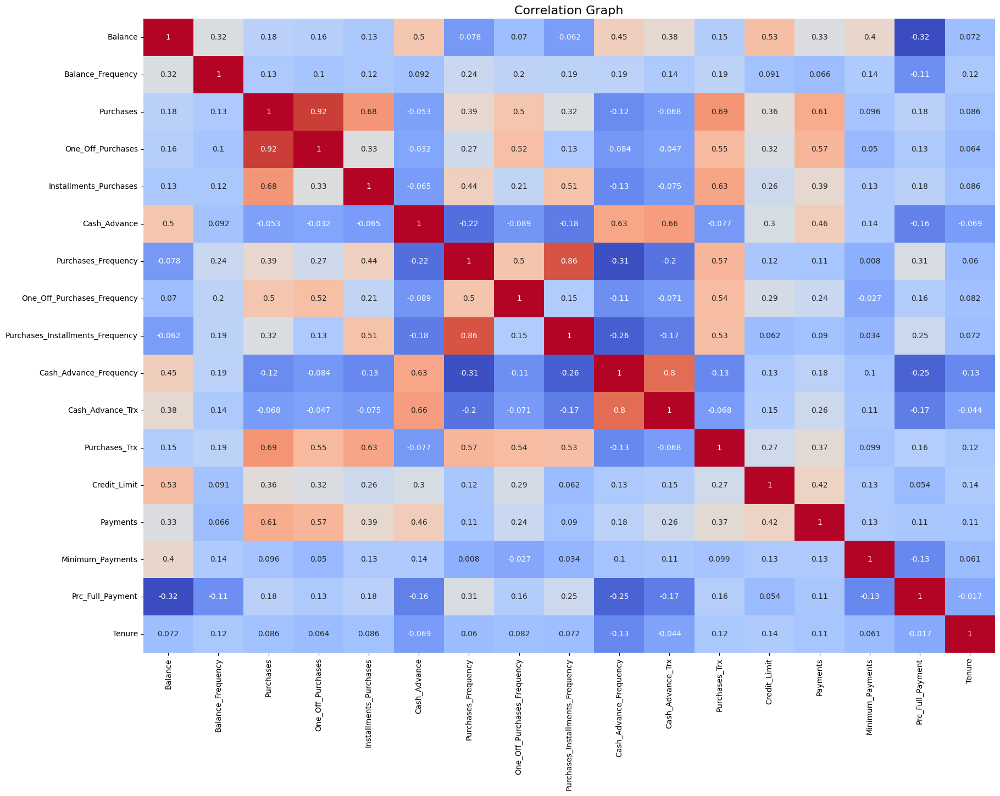

In [ ]:
plt.figure (figsize = [20,15] ,  dpi = 100 )
plt.title ("Correlation Graph" , fontsize = 16)
sns.heatmap (df1.corr(), annot = True, cmap = 'coolwarm', cbar = False)
plt.show ()

## 📈 Visualización de clusters

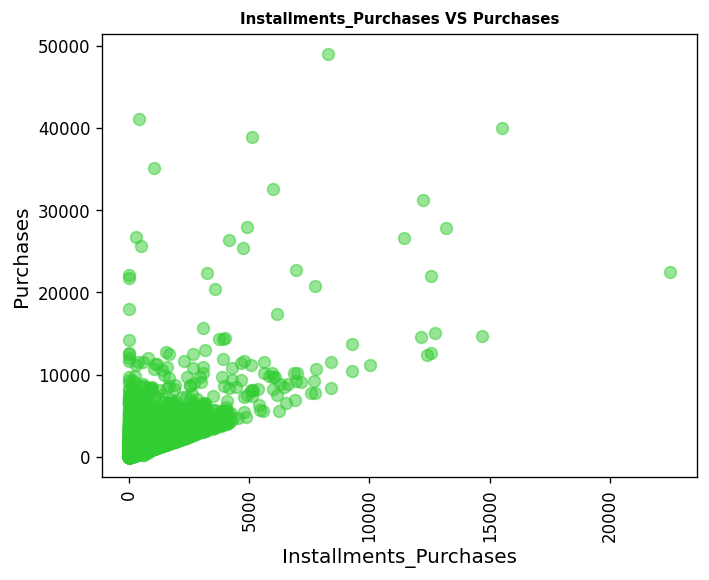

In [ ]:
plt.scatter (df1["Installments_Purchases"] , df1["Purchases"] ,color = "LimeGreen" , s = 50, alpha = 0.5)
plt.xticks (rotation = 90)
plt.title ("Installments_Purchases VS Purchases" , weight = "bold" , color = "black" , fontsize = 9)
plt.xlabel ("Installments_Purchases"  , color = "black")
plt.ylabel ("Purchases" , color = "black")
plt.grid ()
plt.show ()

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler ()
scaled_features = scaler.fit_transform (df1)

In [ ]:
from sklearn.cluster import KMeans

kmeans_set = {"init": "random", "n_init": 10, "max_iter": 300, "random_state": 42} # "n_init" Número de veces que se inicializa el algoritmo con distintos centroides semilla.max_iter Número máximo de iteraciones de refinamiento de centroides por cada inicialización."

List = []
for k in range (1, 11):
    kmeans = KMeans (n_clusters = k, **kmeans_set) # ** opens the dictionary
    kmeans.fit (scaled_features)
    List.append (kmeans.inertia_)

In [ ]:
!pip install kneed

In [ ]:
from kneed import KneeLocator
k1 = KneeLocator (range (1, 11), List, curve = "convex", direction = "decreasing")
k1.elbow

np.int64(4)

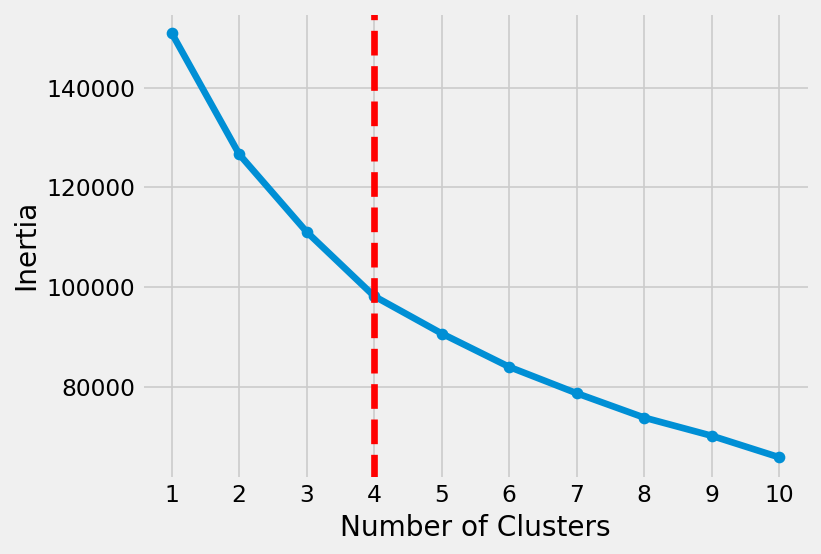

In [ ]:
plt.style.use ("fivethirtyeight")
plt.plot (range (1,11), List , marker = 'o')
plt.xticks (range (1, 11))
plt.xlabel ("Number of Clusters")
plt.ylabel ("Inertia")
# axvline = ax vertical line
plt.axvline (x = k1.elbow, color = "red", label = "axvline - full height",linewidth = 4, linestyle ="--")
plt.show ()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

silhouette_coefficients = []
for k in range (2, 11):
    kmeans = KMeans (n_clusters = k, **kmeans_set)
    kmeans.fit (scaled_features)
    score = silhouette_score (scaled_features, kmeans.labels_)
    silhouette_coefficients.append (score)

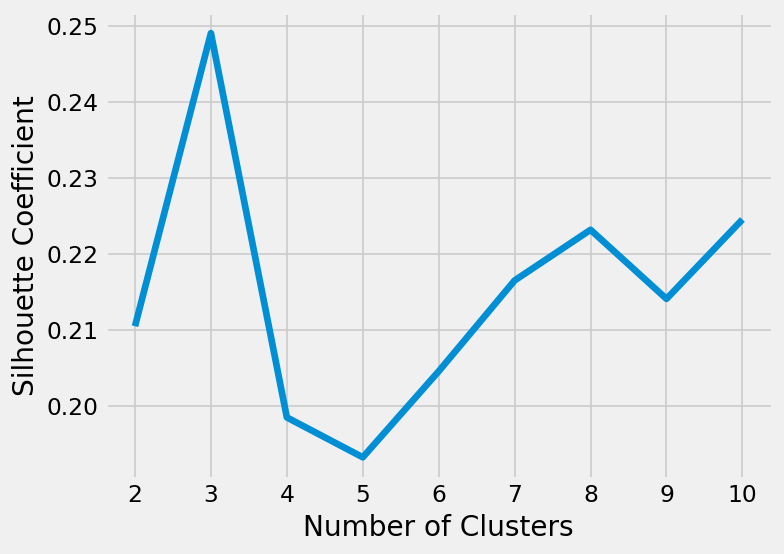

In [ ]:
# Plotting the results:
plt.style.use ("fivethirtyeight")
plt.plot (range (2, 11), silhouette_coefficients)
plt.xticks (range (2, 11))
plt.xlabel ("Number of Clusters")
plt.ylabel ("Silhouette Coefficient")
plt.show ()

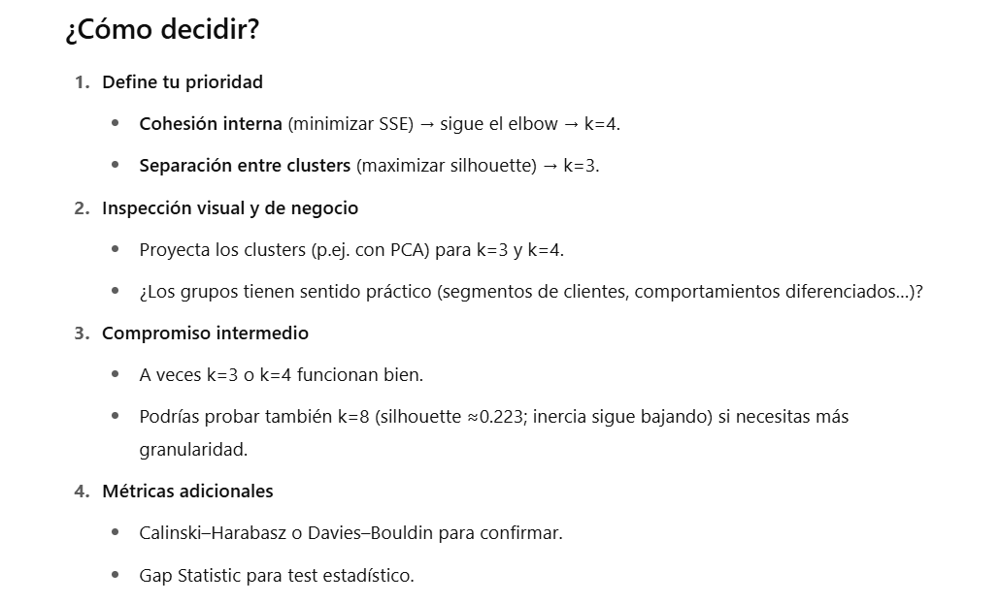

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans (n_clusters = 3)
kmeans = kmeans.fit (df1)

centroids = kmeans.cluster_centers_
print (centroids)

labels = kmeans.labels_
print (labels)

[[8.63970761e+02 8.61987172e-01 6.06219333e+02 3.14244399e+02
  2.92277196e+02 4.99732277e+02 4.66881318e-01 1.55163731e-01
  3.50995631e-01 1.07794284e-01 2.27656274e+00 1.07017217e+01
  2.74393882e+03 9.98402420e+02 5.54290149e+02 1.58429148e-01
  1.14346208e+01]
 [3.39236694e+03 9.41919285e-01 1.58799471e+03 9.92084477e+02
  5.96222060e+02 2.09681053e+03 5.41385223e-01 3.18135481e-01
  3.86006779e-01 2.10269118e-01 5.73127178e+00 2.22020906e+01
  8.99081208e+03 2.87132919e+03 1.55120955e+03 1.35262296e-01
  1.17378049e+01]
 [4.83301557e+03 9.14620970e-01 1.05307798e+04 7.42990541e+03
  3.10103977e+03 5.43050951e+03 7.42298917e-01 5.86638699e-01
  5.97387970e-01 2.30828677e-01 9.25563910e+00 8.44135338e+01
  1.24890977e+04 1.79058694e+04 2.47407345e+03 3.29256820e-01
  1.18421053e+01]]
[0 1 1 ... 0 0 0]


In [ ]:
df2 = df1.copy ()
df2 ["Labels"] = kmeans.labels_
df2

,Balance,Balance_Frequency,Purchases,One_Off_Purchases,Installments_Purchases,Cash_Advance,Purchases_Frequency,One_Off_Purchases_Frequency,Purchases_Installments_Frequency,Cash_Advance_Frequency,Cash_Advance_Trx,Purchases_Trx,Credit_Limit,Payments,Minimum_Payments,Prc_Full_Payment,Tenure,Labels
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,1
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,0.000000,12,1
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8944,193.571722,0.833333,1012.73,1012.73,0.00,0.000000,0.333333,0.333333,0.000000,0.000000,0,2,4000.0,0.000000,0.000000,0.000000,6,0
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,0
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,0
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,0


In [ ]:
cluster = kmeans.labels_
print (cluster)

[0 1 1 ... 0 0 0]


In [ ]:
df2.Labels.value_counts ()

,count
Labels,
0,6451
1,2292
2,133


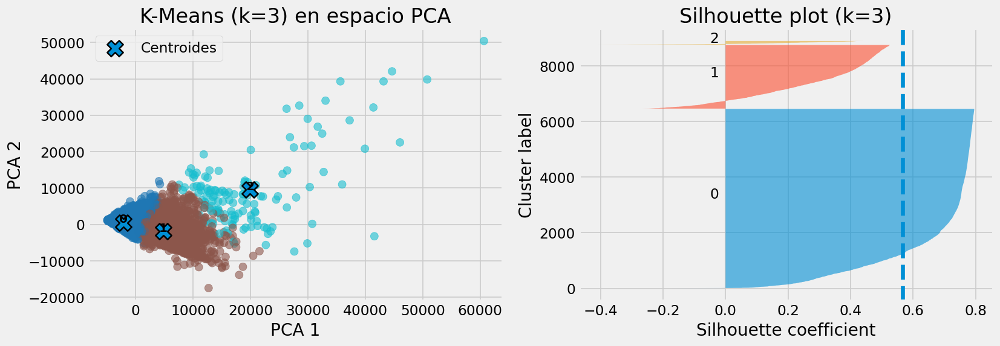

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# 1) Proyectar a 2D vía PCA (en caso de tener más de 2 variables)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df1.values)

# 2) Crear figura con dos subplots: clusters y silhouette
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# ——— Subplot A: clusters con centroides anotados ———
scatter = ax1.scatter(
    X_pca[:, 0], X_pca[:, 1],
    c=labels,        # color por etiqueta de cluster
    cmap='tab10',    # paleta genérica
    alpha=0.6, s=60
)
# centroides en PCA space
cent_pca = pca.transform(centroids)
ax1.scatter(
    cent_pca[:, 0], cent_pca[:, 1],
    marker='X', s=250, edgecolor='k', linewidth=1.5, label='Centroides'
)
# Anotar número de cluster junto al centroide
for idx, (x, y) in enumerate(cent_pca):
    ax1.text(x, y+0.1, str(idx), fontsize=12, fontweight='bold', ha='center')

ax1.set_xlabel('PCA 1')
ax1.set_ylabel('PCA 2')
ax1.set_title('K-Means (k=3) en espacio PCA')
ax1.legend()
ax1.grid(True)

# ——— Subplot B: Silhouette plot para k=3 ———
from sklearn.metrics import silhouette_samples
import numpy as np

sil_vals = silhouette_samples(X_pca, labels)
y_lower = 10
for i in range(3):
    ith_sil = sil_vals[labels == i]
    ith_sil.sort()
    size = ith_sil.shape[0]
    y_upper = y_lower + size
    ax2.fill_betweenx(
        np.arange(y_lower, y_upper),
        0, ith_sil,
        alpha=0.6
    )
    ax2.text(-0.05, y_lower + size/2, str(i))
    y_lower = y_upper + 10  # espacio entre clusters

ax2.set_xlabel('Silhouette coefficient')
ax2.set_ylabel('Cluster label')
ax2.set_title('Silhouette plot (k=3)')
ax2.axvline(x=silhouette_score(X_pca, labels), linestyle='--')

plt.tight_layout()
plt.show()


In [ ]:
#Set number of clusters at initialisation time
k_means = KMeans (n_clusters = 3)

#Run the clustering algorithm
model = k_means.fit (scaled_features)
model

#Generate cluster predictions and store in
y_hat = k_means.predict (scaled_features)

In [ ]:
from sklearn import metrics

labels = k_means.labels_
print ("Silhouette score is :" , metrics.silhouette_score (scaled_features, labels, metric = 'euclidean'))
print ("Calinski-Harabasz score is :" , metrics.calinski_harabasz_score (scaled_features, labels))
print ("Davies-Bouldin score is :" , metrics.davies_bouldin_score(scaled_features, labels))

Silhouette score is : 0.18712369986464714
Calinski-Harabasz score is : 1559.2435384848177
Davies-Bouldin score is : 1.7443847780388


## 📝 Conclusiones

# Interpretación de tus métricas de clustering

- **Silhouette Score = $0.2491$**  
  - Rango: $[-1, +1]$.  
  - Valor $\approx 0.25$ → separación **débil-moderada** entre clusters.  
  - Indica que muchos puntos están cerca del límite entre grupos.

- **Calinski–Harabasz Score = $1591.30$**  
  - Cuanto más alto, mejor: mide varianza inter-cluster vs. intra-cluster.  
  - Un valor de $\approx 1600$ sugiere que hay algo de estructura, pero no es especialmente elevado para datos muy claros.

- **Davies–Bouldin Score = $1.5992$**  
  - Cuanto más bajo, mejor: relación dispersión interna / separación externa.  
  - Un valor $\approx 1.6$ es **moderado**: clusters no están muy bien aislados.

---

## Conclusiones y siguientes pasos

1. **Clusters poco definidos**  
   - El silhouette bajo y el DB moderado indican que los clusters se solapan.  

2. **Probar otro número de clusters**  
   - Repite el análisis variando $k$ (por ejemplo entre $2$ y $6$) y compara estas métricas nuevamente.  
   - Busca un silhouette $\geq 0.3$ y un Davies–Bouldin $\leq 1.5$ como señal de mejora.

3. **Revisar características y escala**  
   - Asegúrate de que las variables usadas contribuyan a separar grupos:  
     - Elimina variables muy correlacionadas o ruido.  
     - Considera transformaciones (log, raíz cuadrada).

4. **Visualizar en 2D**  
   - Usa PCA o t-SNE para proyectar y observar si hay solapamientos claros.

5. **Métricas adicionales**  
   - Gap Statistic para validar estadísticamente el “codo”.  
   - Calinski–Harabasz vs. silhouette de forma conjunta para corroborar.

> 🔄 Itera ajustando $k$, features o transformaciones hasta lograr:  
> - Silhouette $\gtrsim 0.3$  
> - Davies–Bouldin $\lesssim 1.2$  
> - Calinski–Harabasz notablemente más alto que en tu configuración inicial.  
